In [ ]:
import tensorflow as tf
import tensorflow_hub as hub

#Check for GPU availability
print("GPU","available (yesssssss)" if tf.config.list_physical_devices("GPU") else "not available")

GPU not available


In [ ]:
import pandas as pd

In [ ]:
label_data = pd.read_csv("/content/drive/MyDrive/DOGMILO/labels.csv")

In [ ]:
label_data

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


In [ ]:
label_data.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [ ]:
label_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10222 entries, 0 to 10221
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      10222 non-null  object
 1   breed   10222 non-null  object
dtypes: object(2)
memory usage: 159.8+ KB


In [ ]:
label_data.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
label_data.tail()

,id,breed
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher
10221,fff43b07992508bc822f33d8ffd902ae,chesapeake_bay_retriever


In [ ]:
label_data[label_data["breed"] == 'dingo']

,id,breed
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
24,00a338a92e4e7bf543340dc849230e75,dingo
43,0120343862761d052d6a7ade81625c94,dingo
113,02b1c50fb7315423a664f3ce68c94e30,dingo
258,060b163b5ad74c889c47b9f421825cdb,dingo
...,...,...
9367,eaea761df48d7adef74af9c66a0fbf4c,dingo
9804,f6bdbf94ffea753f4f7638784faf01cc,dingo
9834,f776961d52ba3a7112506389623c8586,dingo
9862,f811a137cac1489f074529064f79acfe,dingo


In [ ]:
label_data.sort_values(by='breed')

,id,breed
1249,1ee0c041d15647e3909625eba419f153,affenpinscher
3634,5a533f3bae76091d6866fa60ba2ec9d4,affenpinscher
3656,5b154e409fe61a86f37e842480f44a10,affenpinscher
3725,5cb8e8855145375221015c02fe21b273,affenpinscher
7802,c32fb0c78bfc35f176ae7090155ef2c9,affenpinscher
...,...,...
4372,6d13b34a19bf0776634565f656804ea9,yorkshire_terrier
5088,80d41d9b86778d60e6ae96c1088819f0,yorkshire_terrier
343,083820e6dda52da4c0f200ac36f582dc,yorkshire_terrier
5080,80b3d6c612875eeb936e3d5784729340,yorkshire_terrier


In [ ]:
label_data

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
label_data["breed"].value_counts().mean()

85.18333333333334

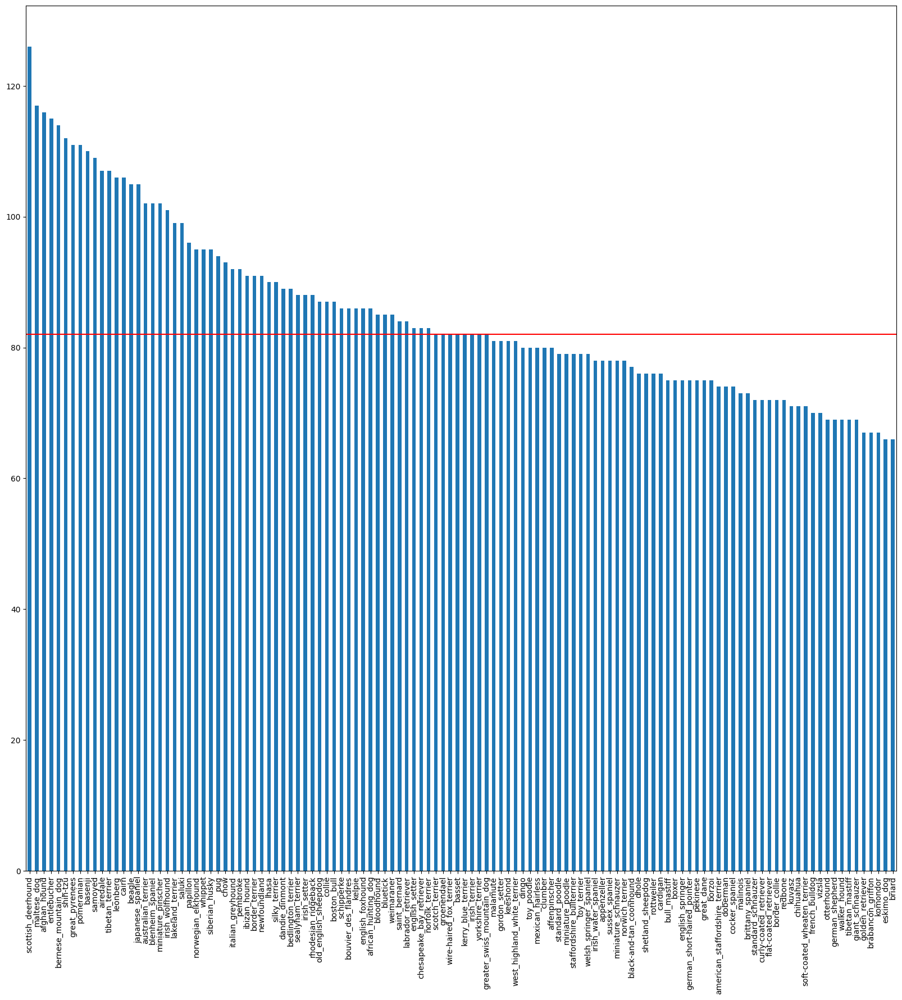

In [ ]:
fig, ax = plt.subplots(figsize = (20,20))
ax = label_data["breed"].value_counts().plot(kind = "bar")
ax.axhline(label_data["breed"].value_counts().median(), color = "red")

In [ ]:
label_data["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

In [ ]:
from IPython.display import Image

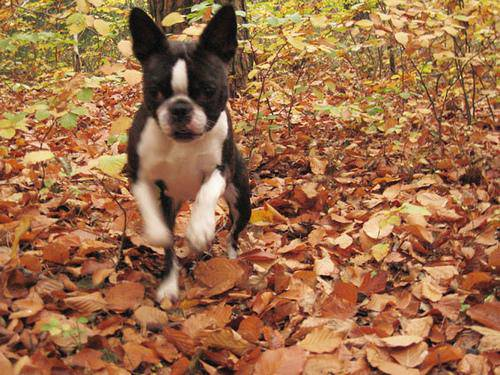

In [ ]:
Image("drive/MyDrive/DOGMILO/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [ ]:
len(label_data["id"].unique())

10222

In [ ]:
id_list = []

In [ ]:
label_data.items()

<generator object DataFrame.items at 0x7c9a504c8580>

In [ ]:
for items in label_data["id"]:
  id_list.append(items)


In [ ]:
len(id_list)

10222

# Another way to create a list of id

In [ ]:
filesname = ["drive/MyDrive/DOGMILO/train/" + fname + ".jpg" for fname in label_data["id"]]

In [ ]:
filesname

['drive/MyDrive/DOGMILO/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/DOGMILO/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/DOGMILO/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/DOGMILO/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/DOGMILO/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/DOGMILO/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/DOGMILO/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/DOGMILO/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/DOGMILO/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/DOGMILO/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/MyDrive/DOGMILO/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/MyDrive/DOGMILO/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/MyDrive/DOGMILO/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/MyDrive/DOGMILO/train/006cc3ddb9dc1bd827479569fcdc52dc.jpg',
 'drive/MyDrive/DOGMILO/train/0075

In [ ]:
import os
if len(os.listdir("drive/MyDrive/DOGMILO/train/")) == len(filesname):
  print("heheheheheh")

heheheheheh


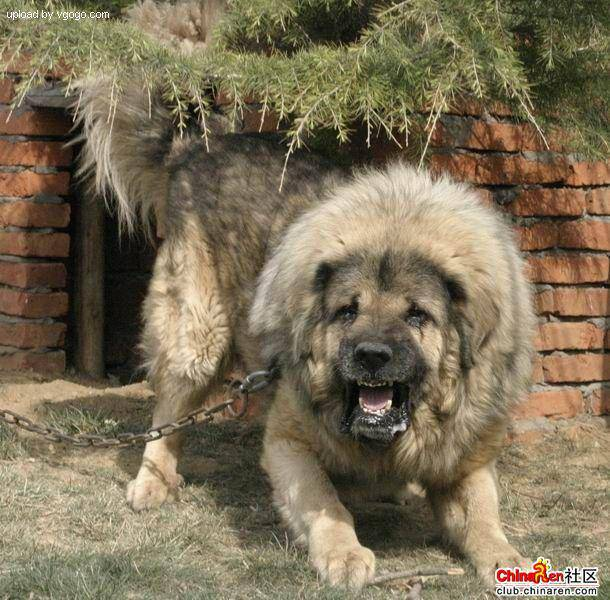

In [ ]:
Image(filesname[9000])

In [ ]:
filesname[9000]

'drive/MyDrive/DOGMILO/train/e20e32bf114141e20a1af854ca4d0ecc.jpg'

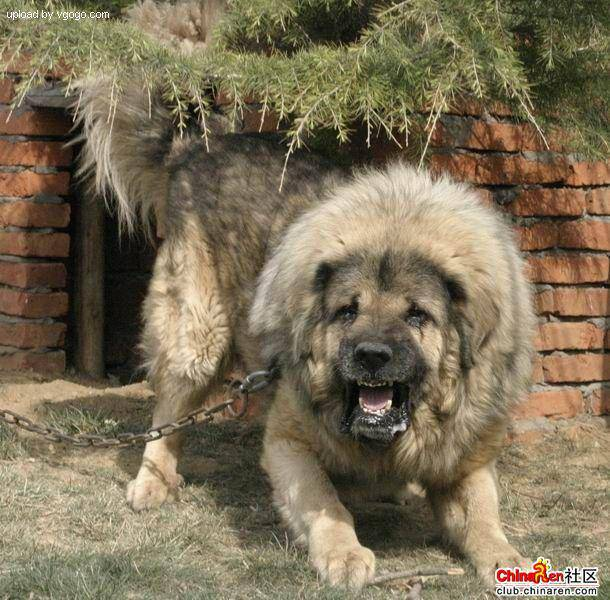

In [ ]:
Image("drive/MyDrive/DOGMILO/train/e20e32bf114141e20a1af854ca4d0ecc.jpg")

In [ ]:
label_data["breed"].unique()

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'borzoi', 'basenji', 'scottish_deerhound',
       'shetland_sheepdog', 'walker_hound', 'maltese_dog',
       'norfolk_terrier', 'african_hunting_dog',
       'wire-haired_fox_terrier', 'redbone', 'lakeland_terrier', 'boxer',
       'doberman', 'otterhound', 'standard_schnauzer',
       'irish_water_spaniel', 'black-and-tan_coonhound', 'cairn',
       'affenpinscher', 'labrador_retriever', 'ibizan_hound',
       'english_setter', 'weimaraner', 'giant_schnauzer', 'groenendael',
       'dhole', 'toy_poodle', 'border_terrier', 'tibetan_terrier',
       'norwegian_elkhound', 'shih-tzu', 'irish_terrier', 'kuvasz',
       'german_shepherd', 'greater_swiss_mountain_dog', 'basset',
       'australian_terrier', 'schipperke', 'rhodesian_ridgeback',
       'irish_setter', 'appenzeller', 'bloodhound', 'samoyed',
       'miniature_schnauzer', 'brittany_spaniel', 'kelpie', 'papillon',
       'borde

In [ ]:
print(label_data["breed"][9000])

tibetan_mastiff


In [ ]:
import numpy as np
labels = label_data["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
 if len(os.listdir("drive/MyDrive/DOGMILO/train")) == len(labels):
  print("boom")

boom


In [ ]:
unique_breed = np.unique(labels)

In [ ]:
len(unique_breed)

120

In [ ]:
unique_breed

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
labels[1] == unique_breed

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
labels[1]

'dingo'

In [ ]:
unique_breed[:50]

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever'], dtype=object)

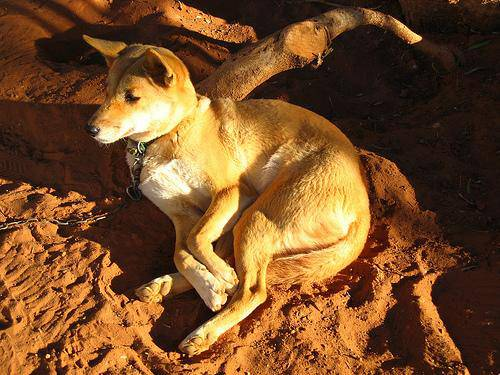

In [ ]:
Image(filesname[1])

In [ ]:
boolean_labels = [label == unique_breed for label in labels]

In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
unique_breed[19]

'boston_bull'

In [ ]:
boolean_labels[0].astype(int)

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [ ]:
np.where(labels[176] == unique_breed)

(array([113]),)

In [ ]:
unique_breed[113]

'walker_hound'

In [ ]:
filesname[:5]

['drive/MyDrive/DOGMILO/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/DOGMILO/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/DOGMILO/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/DOGMILO/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/DOGMILO/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [ ]:
boolean_labels[:5]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
filesname[:5]

['drive/MyDrive/DOGMILO/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/DOGMILO/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/DOGMILO/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/DOGMILO/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/DOGMILO/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

#Create own validation set

In [ ]:
X = filesname
y = boolean_labels

In [ ]:
len(filesname), len(boolean_labels)

(10222, 10222)

In [ ]:
#set number of images to use for experimenting
NUM_IMAGE = 1000 #@param {type:"slider", min:1000, max:10000,step:1000}

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_train,X_val,y_train,y_val = train_test_split(X[:NUM_IMAGE],y[:NUM_IMAGE],test_size=0.2,random_state=42)

In [ ]:
len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train

['drive/MyDrive/DOGMILO/train/00bee065dcec471f26394855c5c2f3de.jpg',
 'drive/MyDrive/DOGMILO/train/0d2f9e12a2611d911d91a339074c8154.jpg',
 'drive/MyDrive/DOGMILO/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
 'drive/MyDrive/DOGMILO/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
 'drive/MyDrive/DOGMILO/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg',
 'drive/MyDrive/DOGMILO/train/0ea5759640f2e1c2d1a06adaf8a54ca7.jpg',
 'drive/MyDrive/DOGMILO/train/03e1d2ee5fd90aef036c90a9e7f81177.jpg',
 'drive/MyDrive/DOGMILO/train/16941a6728ddb9cb7423a6cc97fbe071.jpg',
 'drive/MyDrive/DOGMILO/train/0bedbecd92390ef9f4f7c8b06a629340.jpg',
 'drive/MyDrive/DOGMILO/train/143b9484273e57668d03bfc26755810a.jpg',
 'drive/MyDrive/DOGMILO/train/019ff93e03802e661577b5869e099dcb.jpg',
 'drive/MyDrive/DOGMILO/train/035f28d8ad34afaf7c8d276d6674bf8f.jpg',
 'drive/MyDrive/DOGMILO/train/16ac25747d1a51db033d6461156ddb0b.jpg',
 'drive/MyDrive/DOGMILO/train/14597c96d5c222eebd742f4207296314.jpg',
 'drive/MyDrive/DOGMILO/train/0ff0

In [ ]:
y_train

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

#Turing images into Tensors

In [ ]:
from matplotlib.pyplot import imread

In [ ]:
image = imread(filesname[42])

In [ ]:
image.shape

(257, 350, 3)

In [ ]:
image.ndim

3

In [ ]:
print("hehehe")

hehehe


In [ ]:
IMG_SIZE = 224
def process_image (image_path,img_size = IMG_SIZE):
  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image,channels=3)
  image = tf.image.convert_image_dtype(image,tf.float32)
  image = tf.image.resize(image, size = [IMG_SIZE , IMG_SIZE])
  return image

In [ ]:
tensor = tf.io.read_file(filesname[42])

In [ ]:
type(process_image(filesname[0]))

tensorflow.python.framework.ops.EagerTensor

In [ ]:
tf.image.convert_image_dtype(tf.image.decode_jpeg(tensor,channels=3),tf.float32)

<tf.Tensor: shape=(257, 350, 3), dtype=float32, numpy=
array([[[0.34509805, 0.5411765 , 0.34117648],
        [0.29411766, 0.4901961 , 0.2901961 ],
        [0.24705884, 0.43529415, 0.23137257],
        ...,
        [0.29803923, 0.5254902 , 0.32941177],
        [0.29803923, 0.5254902 , 0.3372549 ],
        [0.29411766, 0.52156866, 0.33333334]],

       [[0.2784314 , 0.47058827, 0.28627452],
        [0.25490198, 0.45098042, 0.25882354],
        [0.24313727, 0.43921572, 0.24705884],
        ...,
        [0.28627452, 0.5137255 , 0.3254902 ],
        [0.2901961 , 0.5176471 , 0.32941177],
        [0.2901961 , 0.5176471 , 0.32941177]],

       [[0.21176472, 0.41176474, 0.2509804 ],
        [0.21960786, 0.41960788, 0.25882354],
        [0.24313727, 0.4431373 , 0.28235295],
        ...,
        [0.27450982, 0.49803925, 0.32156864],
        [0.2784314 , 0.5019608 , 0.3254902 ],
        [0.28235295, 0.5058824 , 0.32941177]],

       ...,

       [[0.00784314, 0.04313726, 0.03921569],
        [0.01

In [ ]:
tf.image.resize(tf.image.convert_image_dtype(tf.image.decode_jpeg(tensor,channels=3),tf.float32), size = [224 , 224])

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117757],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

In [ ]:
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

In [ ]:
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

#Write a function help we turn all of our data in to batches

In [ ]:
BATCH_SIZE = 32
def create_data_batches (X, y=None, batch_size = BATCH_SIZE , valid_data = False , test_data = False):
  if test_data:
    print("Creating test data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  elif valid_data:
    print("Creating valid data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating train data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data = data.shuffle(buffer_size = len(X))
    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)
    return data_batch



In [ ]:
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
train_data = create_data_batches(X_train,y_train)
valid_data = create_data_batches(X_val,y_val,valid_data=True)

Creating train data batches
Creating valid data batches


In [ ]:
train_data.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

In [ ]:
valid_data.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

In [ ]:
import matplotlib.pyplot as plt
def show_25_image(images,labels):
  plt.figure(figsize = (15,15))
  for i in range(32):
    ax = plt.subplot(8,4,i+1)
    plt.imshow(images[i])
    plt.title(unique_breed[labels[i].argmax()])
    plt.axis("off")


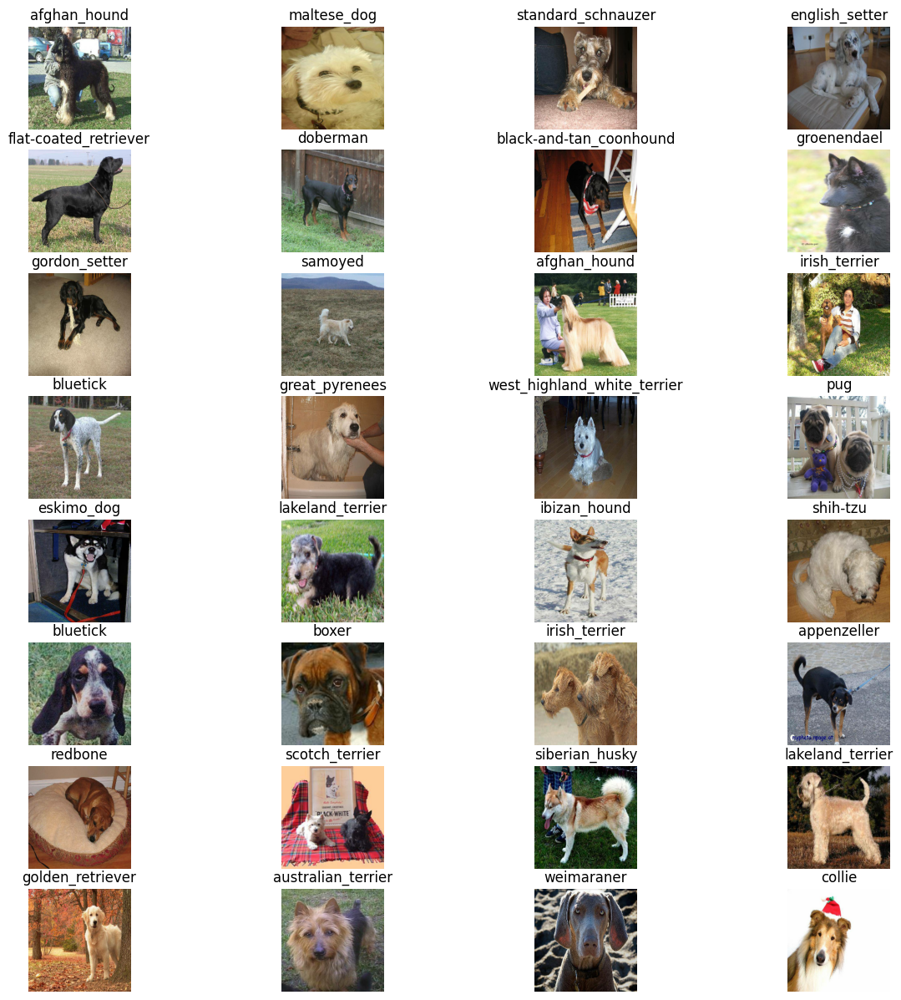

In [ ]:
train_image, train_labels = next(train_data.as_numpy_iterator())
show_25_image(train_image,train_labels)

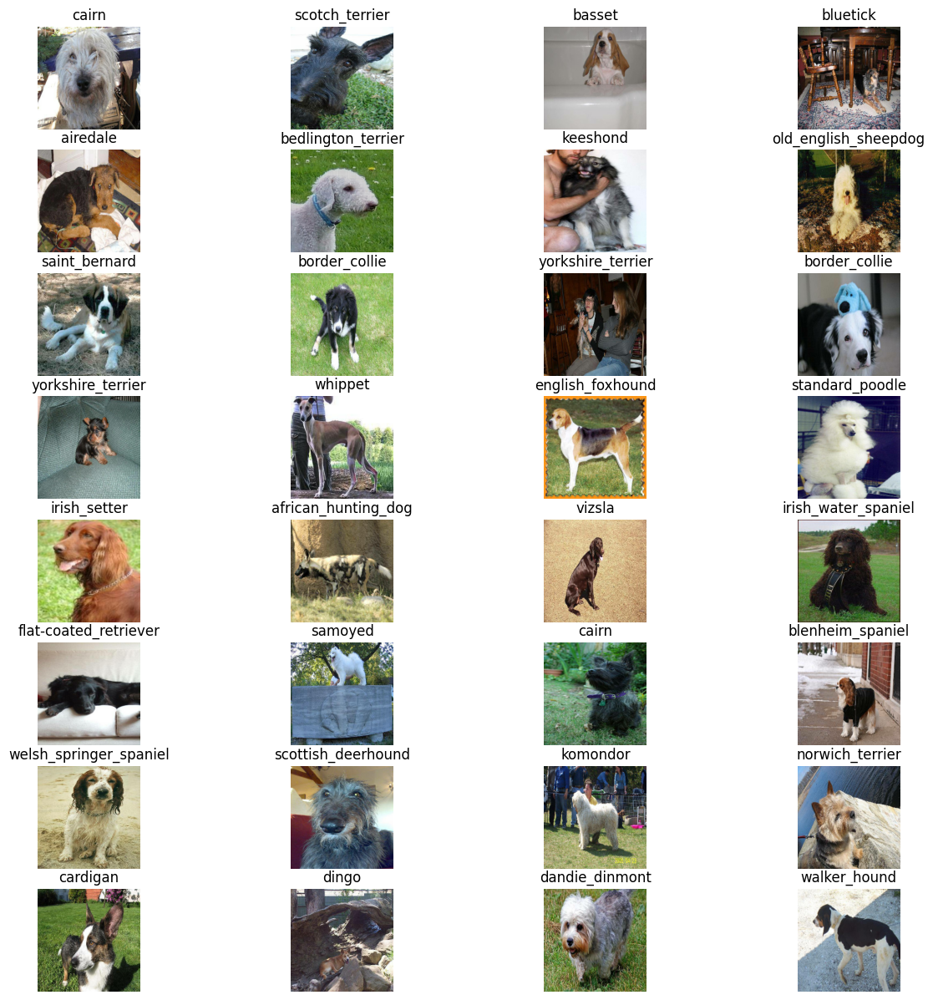

In [ ]:
valid_image, valid_labels = next(valid_data.as_numpy_iterator())
show_25_image(valid_image,valid_labels)

In [ ]:
type(train_image[0])

numpy.ndarray

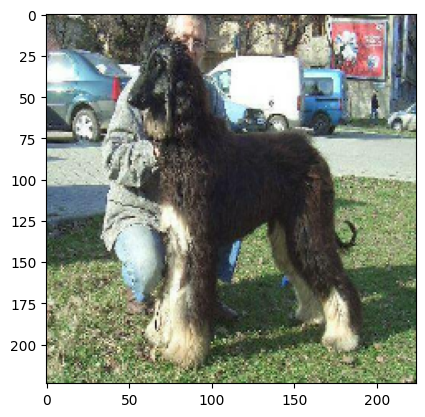

In [ ]:
plt.imshow(train_image[0])

In [ ]:
#setup input shape to the model
INPUT_SHAPE = [None,IMG_SIZE,IMG_SIZE,3]
#setup output shape
OUTPUT_SHAPE = len(unique_breed)
#setup model URL from Tensorflow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"


In [ ]:
def create_model(intput_shape = INPUT_SHAPE,output_shape = OUTPUT_SHAPE,model_url = MODEL_URL):
  print("building model with: ",MODEL_URL)

  #setup model layer
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),
      tf.keras.layers.Dense(units = OUTPUT_SHAPE,activation = "softmax")
  ])
  #compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"],
  )
  #build the model
  model.build(INPUT_SHAPE)

  return model


In [ ]:
model = create_model()
model.summary()

building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
#Creating callback


In [ ]:
%load_ext tensorboard

In [ ]:
import datetime

def create_tensorboard_callback():
  logdir = os.path.join("/drive/MyDrive/DOGMILO/logs",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)


In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

In [ ]:
NUM_EPOCHS = 100 #@param{type:"slider",min:10, max:100,step:10}

In [ ]:
print("GPU","available (yesssssss)" if tf.config.list_physical_devices("GPU") else "not available")

GPU available (yesssssss)


In [ ]:
def train_model():
  model = create_model()
  tensorboard = create_tensorboard_callback()
  model.fit(x = train_data,epochs=NUM_EPOCHS,validation_data=valid_data,validation_freq=1,callbacks=[tensorboard,early_stopping])

  return model

In [ ]:
model = train_model()

building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 8s 168ms/step - loss: 4.7225 - accuracy: 0.0875 - val_loss: 3.5870 - val_accuracy: 0.2350
Epoch 2/100
25/25 [==============================] - 3s 108ms/step - loss: 1.7237 - accuracy: 0.6400 - val_loss: 2.1948 - val_accuracy: 0.4750
Epoch 3/100
25/25 [==============================] - 3s 106ms/step - loss: 0.5908 - accuracy: 0.9350 - val_loss: 1.6985 - val_accuracy: 0.5600
Epoch 4/100
25/25 [==============================] - 4s 143ms/step - loss: 0.2617 - accuracy: 0.9875 - val_loss: 1.5206 - val_accuracy: 0.5850
Epoch 5/100
25/25 [==============================] - 3s 102ms/step - loss: 0.1494 - accuracy: 0.9962 - val_loss: 1.4252 - val_accuracy: 0.6000
Epoch 6/100
25/25 [==============================] - 3s 107ms/step - loss: 0.1031 - accuracy: 1.0000 - val_loss: 1.3684 - val_accuracy: 0.6350
Epoch 7/100
25/25 [=============================

In [ ]:
%tensorboard --logdir /drive/MyDrive/DOGMILO/logs

Reusing TensorBoard on port 6006 (pid 8533), started 0:05:55 ago. (Use '!kill 8533' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
len(valid_data)

7

In [ ]:
predictions = model.predict(valid_data,verbose=1)
predictions

7/7 [==============================] - 1s 84ms/step


array([[1.05113932e-03, 8.92021417e-05, 7.15911854e-04, ...,
        1.02696096e-04, 5.27277771e-05, 1.47051306e-03],
       [7.50734122e-04, 5.78049454e-04, 3.91265517e-03, ...,
        1.60353753e-04, 2.14326591e-03, 1.19714154e-04],
       [3.66921154e-06, 5.35302797e-06, 5.14159819e-06, ...,
        1.09436332e-05, 2.16076546e-06, 1.94360782e-05],
       ...,
       [1.21043314e-07, 3.38449513e-06, 4.98706504e-06, ...,
        1.79811752e-06, 2.19847716e-05, 9.47369699e-05],
       [3.78079619e-03, 1.29089560e-04, 6.33200179e-05, ...,
        2.44856728e-05, 2.34290110e-05, 1.05725471e-02],
       [2.04053312e-03, 4.69345177e-05, 1.17921084e-03, ...,
        6.34635333e-03, 5.10017970e-04, 3.97440126e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
type(predictions)

numpy.ndarray

In [ ]:
np.argmax(predictions[0])

26

In [ ]:
predictions[0].argmax()

26

In [ ]:
predictions[0][26]*100

36.15163564682007

In [ ]:
np.max(predictions[0])

0.36151636

In [ ]:
unique_breed[26]

'cairn'

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[0])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[0])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_breed[np.argmax(predictions[0])]}") # the predicted label

[1.05113932e-03 8.92021417e-05 7.15911854e-04 8.50219512e-05
 1.80880059e-04 8.90959491e-05 8.72894842e-03 1.70918938e-04
 2.40932612e-04 3.97025840e-04 3.00014828e-04 1.16669352e-03
 8.21805908e-04 8.34436578e-05 2.25428012e-04 5.74026024e-04
 1.10354966e-04 1.23030305e-01 3.48085850e-05 9.46887740e-05
 4.96895169e-04 5.33197162e-05 5.86372626e-05 2.33188868e-04
 3.60842569e-05 1.40364122e-04 3.61516356e-01 4.28913845e-05
 1.18855620e-04 2.05915398e-03 4.26336883e-05 3.71718337e-03
 1.46422419e-03 4.15472641e-05 2.34104897e-04 2.77624931e-02
 2.50289431e-05 1.28415937e-04 4.89403101e-05 8.94501136e-05
 8.22680944e-04 1.06607604e-05 5.73318393e-04 7.78948088e-05
 4.93782500e-06 5.96235506e-04 1.27109834e-05 1.59952528e-04
 3.34871770e-03 7.22435769e-04 7.75992667e-05 6.55883778e-05
 1.24815211e-04 2.64552782e-05 5.17841763e-05 1.65650981e-05
 4.86794524e-05 2.06470303e-03 1.10318244e-03 4.24361937e-02
 5.08535828e-04 2.27116561e-05 5.60041459e-04 3.86450702e-05
 2.47108843e-03 2.722652

In [ ]:
def get_pred_label(predictions_probabilities):
  return unique_breed[np.argmax(predictions_probabilities)]

In [ ]:
get_pred_label(predictions[0])

'cairn'

In [ ]:
image_ = []
labels_ = []
for image, label in valid_data.unbatch().as_numpy_iterator():
    image_.append(image)
    labels_.append(label)

In [ ]:
image_[0]

array([[[0.29599646, 0.43284872, 0.3056691 ],
        [0.26635826, 0.32996926, 0.22846507],
        [0.31428418, 0.27701408, 0.22934894],
        ...,
        [0.77614343, 0.82320225, 0.8101595 ],
        [0.81291157, 0.8285351 , 0.8406944 ],
        [0.8209297 , 0.8263737 , 0.8423668 ]],

       [[0.2344871 , 0.31603682, 0.19543913],
        [0.3414841 , 0.36560842, 0.27241898],
        [0.45016077, 0.40117094, 0.33964607],
        ...,
        [0.7663987 , 0.8134138 , 0.81350833],
        [0.7304248 , 0.75012016, 0.76590735],
        [0.74518913, 0.76002574, 0.7830809 ]],

       [[0.30157745, 0.3082587 , 0.21018331],
        [0.2905954 , 0.27066195, 0.18401104],
        [0.4138316 , 0.36170745, 0.2964005 ],
        ...,
        [0.79871625, 0.8418535 , 0.8606443 ],
        [0.7957738 , 0.82859945, 0.8605655 ],
        [0.75181633, 0.77904975, 0.8155256 ]],

       ...,

       [[0.9746779 , 0.9878955 , 0.9342279 ],
        [0.99153054, 0.99772066, 0.9427856 ],
        [0.98925114, 0

In [ ]:
labels_

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
get_pred_label(labels_[0])

'cairn'

In [ ]:
get_pred_label(predictions[0])

'cairn'

In [ ]:
def unbatchdata(data):
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breed[np.argmax(label)])

  return images, labels


In [ ]:
val_image, val_labels = unbatchdata(valid_data)

In [ ]:
val_image[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

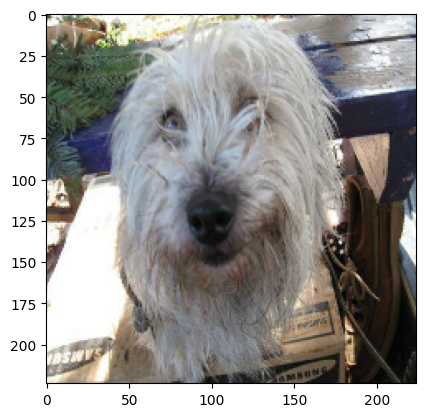

In [ ]:
plt.imshow(val_image[0])

In [ ]:
def plot_pred(predictions_probabilities,labels,images,n = 1):
  pred_prob,true_label,image = predictions_probabilities[n],labels[n],images[n]

  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

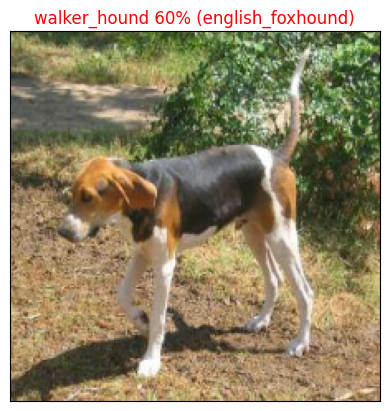

In [ ]:
plot_pred(predictions_probabilities=predictions,labels=val_labels,images=val_image,n=42)